# Visualizations

## Inputs

- `models/*.nc5`: results from the connectivity classifier notebook.

## Outputs

- Figure 2: model performance + brain networks
- Figure 3: feature importance
- Figure 4: robustness of feature importance
- Figure 5: SHAP

## Requirements

```bash
mamba env create -f environment.yml
conda activate acnets
```

In [2]:
# SETUP

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import xarray as xr
from sklearn.model_selection import StratifiedShuffleSplit

import shap
import re

sns.set('paper', style='whitegrid')

In [ ]:
INPUT_FILENAME = 'connectivities_classifier-SVM_measure-accuracy_shap-disabled_agg-region_top-10_cv-10x4fold'



results = xr.open_dataset('models/' + INPUT_FILENAME + '.nc5').load()

results

In [5]:
split_score_cols = [c for c in list(results.keys()) if re.match(r'split\d+_test_score', c)]
grid_cv_results = results[split_score_cols + ['rank_test_score', 'mean_test_score']].to_pandas()
grid_cv_results.index.name = 'label'
grid_cv_results = grid_cv_results.reset_index()

In [10]:
ATLAS = 'difumo64_regions'
KIND = 'partial-correlation'
MODEL_NAME = f'{ATLAS}_{KIND}'


n_subjects = results['n_subjects'].item()
X = results['X'].values
y = results['y'].values
feature_names = results[f'{ATLAS}_feature'].values
y_encoder = LabelEncoder().fit(y)
cv_test_size = results['cv_test_size'].item()
cv_n_splits = results['cv_n_splits'].item()
scoring = results['scoring'].item()
cv = StratifiedShuffleSplit(n_splits=cv_n_splits, test_size=cv_test_size)
perm_scores = results.sel(model_name=MODEL_NAME)['perm_scores'].values
perm_obs_scores = results.sel(model_name=MODEL_NAME)['cv_scores'].values
perm_pvalue = results.sel(model_name=MODEL_NAME)['pvalue'].item()
# perm_imp_scores = results[f'{MODEL_NAME} importances'].to_pandas()

if 'shap-enabled' in INPUT_FILENAME:
    shap_values = results[f'{MODEL_NAME} shap'].values
    shap_importances = results[f'{MODEL_NAME} shap'].to_pandas().mean().reset_index()
    shap_importances.columns = ['feature_name', 'shap']
    shap_data = results[f'{MODEL_NAME} shap data'].values
    shap_y_pred = results[f'{MODEL_NAME} shap y_pred'].values
    shap_y_test = results[f'{MODEL_NAME} shap y_test'].values
    shap_values = shap.Explanation(
        values=shap_values,
        data=shap_data,
        feature_names=feature_names,
        output_indexes=y_encoder.transform(shap_y_pred),
        output_names=y_encoder.classes_
    )


In [52]:
# prep grid data
scores = grid_cv_results
# scores['label'] = scores['params'].apply(lambda p: ' '.join(p.values()))
split_score_cols = [c for c in scores.columns if 'split' in c]
scores['test_score'] = scores[split_score_cols].apply(lambda x: list(x), axis=1)
scores = scores.explode('test_score').reset_index(drop=True)
scores = scores.sort_values('rank_test_score', ascending=False)

scores['atlas'] = scores['label'].apply(lambda x: '_'.join(x.split('_')[0:2]))
scores['kind'] = scores['label'].apply(lambda x: x.split('_')[2])

ATLASES_TO_PLOT = ['difumo64_regions']

scores = scores.query('atlas in @ATLASES_TO_PLOT').copy()

scores = scores[['label', 'atlas', 'kind', 'test_score', 'mean_test_score']]

# simulate chance
chance_scores = {}
for model_name in scores['label'].unique():
    chance_model = DummyClassifier(strategy='stratified').fit(X, y)
    _chance_scores = cross_val_score(chance_model, X, y,
                                     cv=StratifiedShuffleSplit(n_splits=cv_n_splits, test_size=cv_test_size), scoring=scoring)
    chance_scores[model_name] = _chance_scores

chance_scores = pd.DataFrame(chance_scores)
chance_scores = chance_scores.melt(value_name=scoring, var_name='label')

# sort, mean score and ordering
scores = scores.sort_values('mean_test_score', ascending=True)
mean_scores = scores.groupby('label')[['test_score']].mean().reset_index()
order = scores['label'].drop_duplicates()

# percentage accuracy
scores['accuracy_pct'] = scores['test_score'] * 100.0


chance_scores['accuracy_pct'] = chance_scores['accuracy'] * 100.0
mean_scores['accuracy_pct'] = mean_scores['test_score'] * 100.0

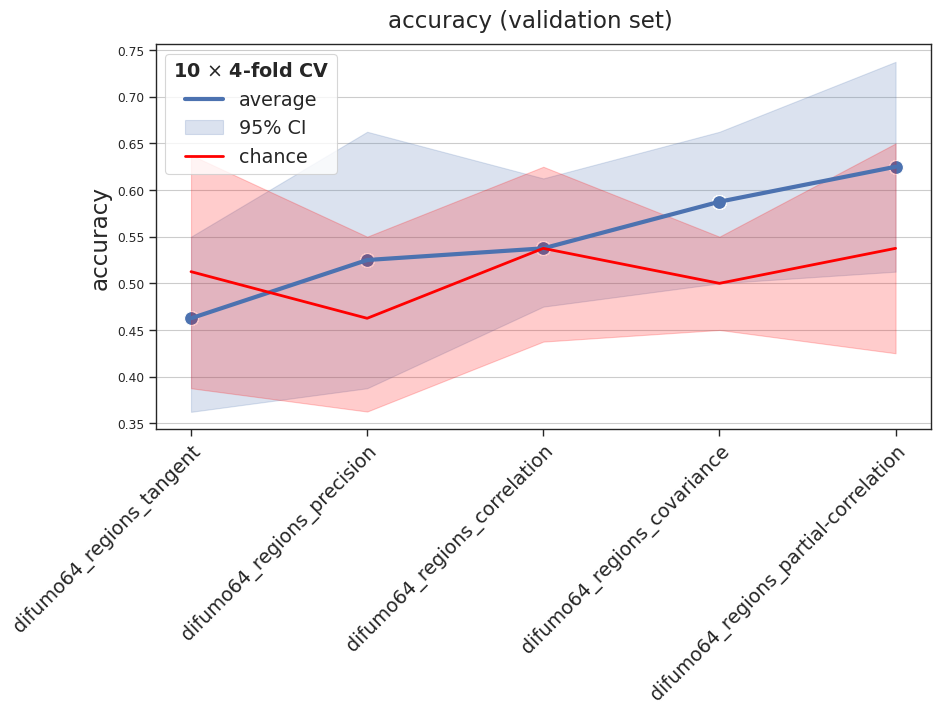

In [56]:
# %%script echo skipping...

# PLOT MODEL PERFORMANCE

sns.set('paper', 'ticks')

_, ax = plt.subplots(figsize=(len(results['grid_model_name']) * 2, 5))

# score curve + CI
sns.lineplot(data=scores, x='label', y='test_score', lw=3, sort=False, ax=ax)

# blue dots
sns.scatterplot(data=scores, x='label', y='mean_test_score', marker='o', s=100, ax=ax, label='_nolegend_')

# plot chance
sns.lineplot(data=chance_scores, x='label', y=scoring, lw=2, sort=False, ax=ax, color='red')

# legend
ax.legend(['average', '95% CI', 'chance'],
            title_fontproperties={'weight': 'bold', 'size': 'x-large'},
            prop={'size': 'x-large'}, loc='upper left',
            title=f'{cv.n_splits} $\\times$ {n_subjects // cv.test_size}-fold CV')

# tweaks
ax.set_xlabel('')
ax.set_ylabel(scoring, fontsize='xx-large')
plt.xticks(rotation=45, ha='right', fontsize='x-large', rotation_mode='anchor')
plt.suptitle(f'{scoring} (validation set)', fontsize='xx-large', y=.95)
plt.grid(axis='y')

plt.show()

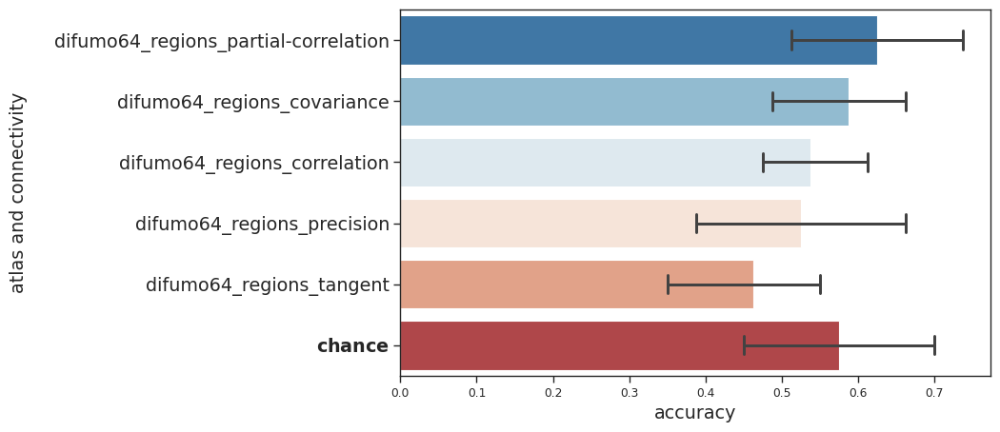

In [57]:
# %%script echo skipping...

# SIGNIFICANCE TESTING

chance_model = DummyClassifier(strategy='stratified')
dummy_scores = cross_val_score(chance_model, X, y, cv=cv, scoring=scoring)

# visible_labels = ['chance','dosenbach2010 tangent', 'dosenbach2010 precision', 'dosenbach2010'
#        'dosenbach2010 partial correlation']

# scores = scores.query('label in @visible_labels')


scores = pd.concat([pd.DataFrame({
    'test_score': dummy_scores,
    'label': '$\\bf{chance}$'
}), scores]).reset_index()

_, ax = plt.subplots(figsize=(8, 5))


sns.set('paper', style='white')
g = sns.barplot(data=scores[::-1], y='label', x='test_score', orient='h', errorbar=('ci', 95), capsize=.3, ax=ax, palette='RdBu_r')
ax.set_xlabel(scoring, fontsize='x-large')
ax.set_yticklabels(ax.get_yticklabels(), fontsize='x-large')

ax.set_ylabel('atlas and connectivity', fontsize='x-large', labelpad=20)

plt.show()


Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.


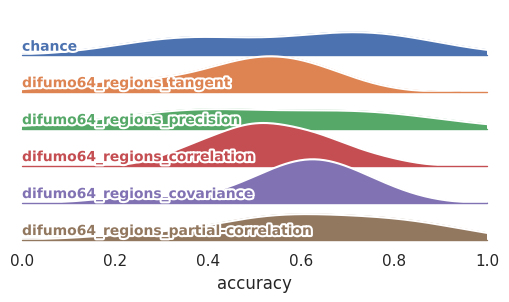

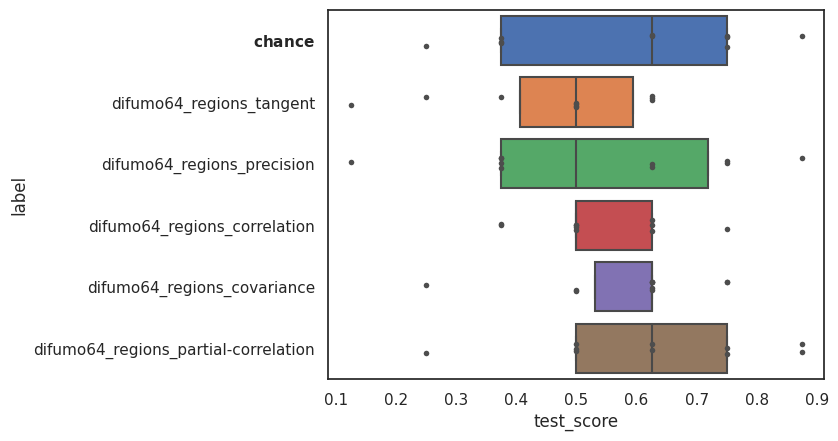

In [60]:
# %%script echo skipping...

# PLOTS
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

g = sns.FacetGrid(scores, row="label", hue="label", aspect=12, height=.5)

# Draw the densities in a few steps
g.map(sns.kdeplot, "test_score",fill=True, alpha=1, linewidth=1)
g.map(sns.kdeplot, "test_score", color="w", lw=1.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=1, linestyle="-", color=None, clip_on=False)

import matplotlib.patheffects as PathEffects

def label(x, color, label):
    ax = plt.gca()
    txt = ax.text(0, .2, label.replace('_2mm',''), color=color, weight='bold', fontsize=10,
            ha="left", va="center", transform=ax.transAxes)
    txt.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])


g.map(label, "label")

# Set the subplots to overlap
g.figure.subplots_adjust(hspace=-.2)

# Remove axes details that don't play well with overlap
g.set_titles("")
g.set(yticks=[], ylabel='', xlabel=scoring, xlim=(0, 1))
g.despine(bottom=True, left=True)

# g.figure.gca().axvline(x=0.8, color='brown', linestyle='-', linewidth=2)

plt.show()

# BOX PLOT
sns.boxplot(data=scores, x='test_score', y='label', whis=0, fliersize=0, saturation=1)
sns.stripplot(x="test_score", y="label", data=scores, size=4, color=".3", linewidth=0)

plt.show()

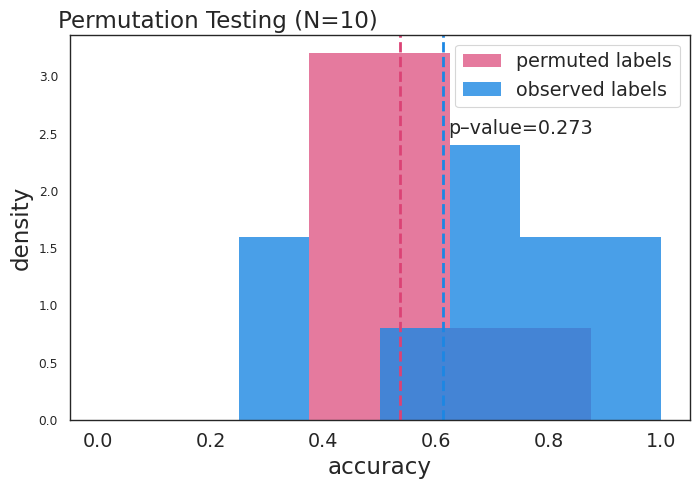

In [62]:
# %%script echo skipping...

# Now plot permuted scores along with the cross-validated scores

sns.set('paper','white')
_, ax = plt.subplots(figsize=(8,5))

# permutation scores
sns.histplot(perm_scores, ax=ax, color=(.86, .26, .46), lw=0, bins=cv_test_size, binrange=(0,1), stat='density', label='permuted labels',alpha=.7)
# sns.kdeplot(perm_scores, ax=ax, color=(.86, .26, .46), lw=2, cut=0, bw_method=.5)
ax.axvline(perm_scores.mean(), color=(.86, .26, .46), ls='--', lw=2)

# observation scores
sns.histplot(perm_obs_scores, ax=ax, color=(.11, .53, .89), lw=0, bins=cv_test_size, binrange=(0,1), stat='density',  label='observed labels', alpha=.8)
# g = sns.kdeplot(perm_obs_scores, ax=ax, color=(.11, .53, .89), lw=2, fill=True, cut=0, bw_method=.5)
ax.axvline(perm_obs_scores.mean(), color=(.11, .53, .89), ls='--', lw=2)

# tweaks
plt.xlabel('accuracy', fontsize='xx-large')
plt.ylabel('density', fontsize='xx-large')
plt.xticks(fontsize='x-large')

plt.suptitle(f'Permutation Testing (N={len(perm_scores)})', x = .31, y=.93, fontsize='xx-large')
plt.legend(loc='upper right', fontsize='x-large')

plt.text(perm_obs_scores.mean() + .01,  2.5, f'p–value={perm_pvalue:.3f}', fontsize='x-large')

plt.show()

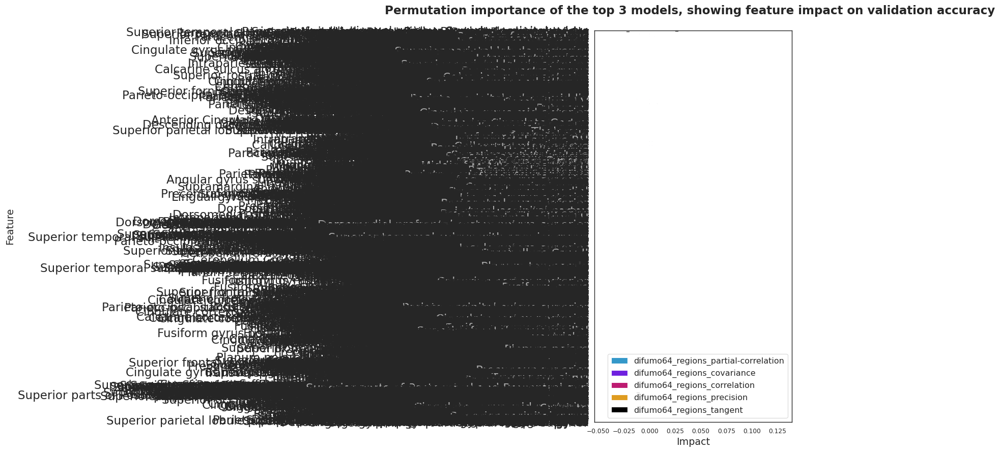

In [64]:
# results[f'{model_name} importances'].to_pandas()
# results.sel(model_name=['dosenbach2010 partial correlation', 'dosenbach2010 precision'])

top_model_names = [f'{name}' for name in results['model_name'].values[:10]]
# top_model_scores = scores.query('label in @top_model_names').sort_values('mean_test_score')
colors = ['#1BA1E2', '#6A00FF', '#D80073', 'orange', 'black', 'red']
pallete = sns.color_palette(colors)


top_model_importances = []

for model_name in top_model_names:
    df = results[model_name + ' importances'].to_pandas()
    df['model_name'] = model_name
    top_model_importances.append(df)

top_model_importances = pd.concat(top_model_importances).reset_index(drop=True)
top_model_importances = top_model_importances.melt(id_vars=['model_name'], var_name='feature', value_name='importance')
top_model_importances['model_name'] = top_model_importances['model_name'].apply(lambda x: x.replace(' importances',''))

fig, ax = plt.subplots(figsize=(5, 10))

order = results[f'{top_model_names[0]} importances'].to_pandas().mean().sort_values(ascending=False).index.to_list()


g = sns.barplot(data=top_model_importances,  x='importance', y='feature', hue='model_name',
                order=order,
                errwidth=1,
                palette=pallete,
                errorbar=('ci', .95),
                orient='h', ax=ax)


for tick in g.get_yticklabels():
    if '\N{left right arrow}' not in str(tick):
        tick.set_color('darkgray')

plt.yticks(fontsize='xx-large')
plt.ylabel('Feature', fontsize='x-large')
plt.xlabel('Impact', fontsize='x-large')

plt.legend(fontsize='large', loc='lower right')

plt.suptitle('Permutation importance of the top 3 models, showing feature impact on validation accuracy',
             fontweight='bold',
             fontsize='xx-large', y=.93)

plt.show()

In [65]:
shap.summary_plot(shap_values,
                  feature_names=feature_names,
                  max_display=21)

NameError: name 'shap_values' is not defined

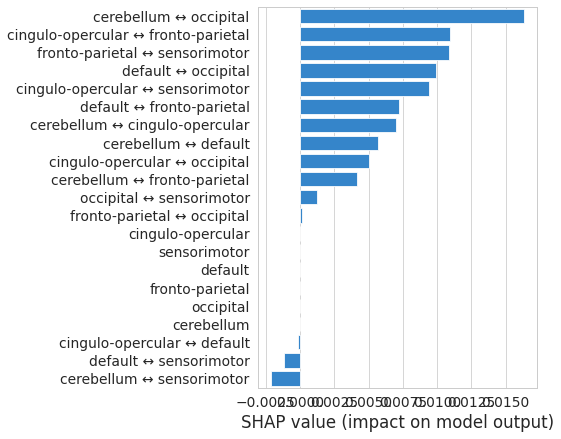

In [12]:

_, ax = plt.subplots(1,1,figsize=(5,7))
sns.barplot(data=shap_importances.sort_values('shap')[::-1],
            x='shap',
            y='feature_name',
            orient='horizontal',
            capsize=.3,
            errwidth=2,
            color=(.11, .53, .89),
            ax=ax)

plt.xticks(fontsize='x-large')
plt.yticks(fontsize='x-large')
plt.ylabel('')
plt.xlabel('SHAP value (impact on model output)', fontsize='xx-large')
plt.show()

In [14]:
def clean_network_labels(label):
    new_label = (label.replace('None', 'unassigned')
                      .replace('cingulo-opercular', 'CON')
                      .replace('fronto-parietal', 'FPN')
                      .replace('fonto-parietal', 'FPN')
                      .replace('cerebellum', 'Cerebellum')
                      .replace('occipital', 'Occipital')
                      .replace('sensorimotor', 'SMN')
                      .replace('CinguloOperc', 'CON')
                      .replace('default', 'DMN')
                      .replace('SMhand', 'SMN (hand)')
                      .replace('SMmouth', 'SMN (mouth)')
                      .replace('VentralAttn', 'VAN')
                      .replace('DorsalAttn', 'DAN')
                      .replace('DefaultMode', 'DMN')
                      .replace('Default', 'DMN')
                      .replace('Salience', 'SN')
                      .replace('RetrosplenialTemporal', 'RSTC')
                      .replace('CinguloParietal', 'CPN')
                      .replace('FrontoParietal', 'FPN')
    )
    return new_label


FixedFormatter should only be used together with FixedLocator


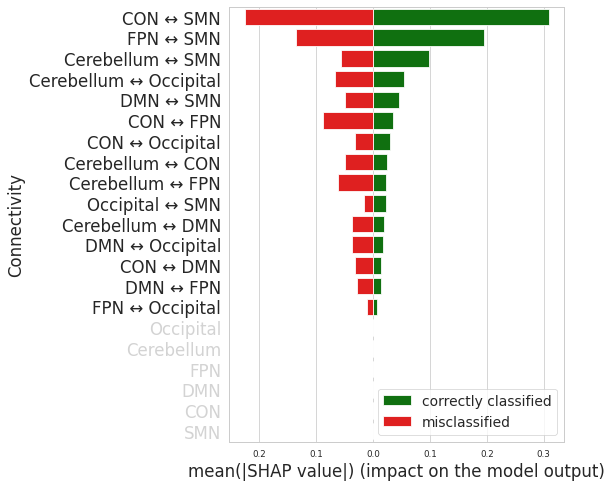

In [30]:
# DIAGNOSIS OF MISCLASSIFICATION

incorrect_pred_mask = np.where(shap_y_pred != shap_y_test)[0]     # miss classified
correct_pred_mask = np.where(shap_y_pred == shap_y_test)[0]     # correctly classified

sns.set('paper', 'whitegrid')

# DBEUG
# shap.summary_plot(shap_values.values[misclassified_mask],
#                   plot_type='bar', feature_names=feature_names)

missclassified_shaps = np.abs(shap_values.values[incorrect_pred_mask]).mean(axis=0)

plot_data = pd.DataFrame({
    'incorrect_shap': np.abs(shap_values.values[incorrect_pred_mask]).mean(axis=0),
    'correct_shap': np.abs(shap_values.values[correct_pred_mask]).mean(axis=0),
    'feature_name': feature_names
})

plot_data = plot_data.sort_values('correct_shap', ascending=False)
plot_data['incorrect_shap'] = -plot_data['incorrect_shap']

plot_data['feature_name'] = plot_data['feature_name'].apply(clean_network_labels)

_, ax = plt.subplots(1,1,figsize=(6,8))

sns.barplot(data=plot_data, x='correct_shap', y='feature_name', color='green', ax=ax, label='correctly classified')
sns.barplot(data=plot_data, x='incorrect_shap', y='feature_name', color='red', ax=ax, label='misclassified')

# ax.text(.05, 7.5, 'Correctly\nClassified', color='blue', fontsize='x-large', ha='left')
# ax.text(-.05, 7, 'Misclassified', color='red', fontsize='x-large', ha='right')

plt.yticks(fontsize='xx-large')
plt.legend(fontsize='x-large', loc='lower right')

for tick in ax.get_yticklabels():
    if '\N{left right arrow}' not in str(tick):
        tick.set_color('lightgray')

ax.set_xticklabels([np.round(np.abs(t), 2) for t in ax.get_xticks()])

ax.set_xlabel('mean(|SHAP value|) (impact on the model output)', fontsize='xx-large')
ax.set_ylabel('Connectivity', fontsize='xx-large')

# plt.suptitle(f'SHAP values for {n_samples} correctly classified subjects sampled from all the cross-validation validation splits.\n', ha='left', x=-.3, y=.9, fontsize=14)
plt.savefig('outputs/figures/shap_top-1.png', dpi=300, bbox_inches='tight')
plt.show()